# Proyecto 3 Visión por Computadora: Stitching
Santiago Díaz, Ana María Garzón

Este proyecto tiene como objetivo realizar una recontrucción de una escena del crimen a partir de la unión de 5 fotografías tomadas desde diferentes perspectivas, buscando abarcar la mayor cantidad de información visual de la escena.

El proceso que se llevará a cabo se puede visualizar en el siguiente diagrama de flujo:

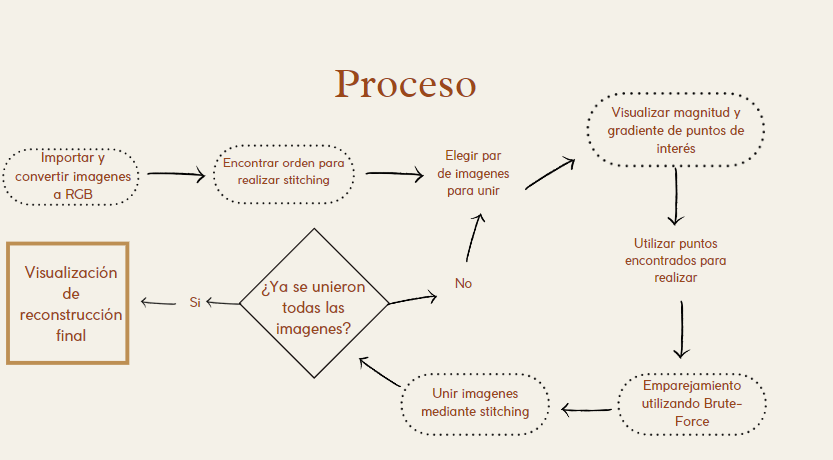

**Importar imagenes y librerías**

Para comenzar se importan las librerías necesarias para el desarrollo del proyecto

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

A continuación, se importan y se visualizan las imagenes a emparejar

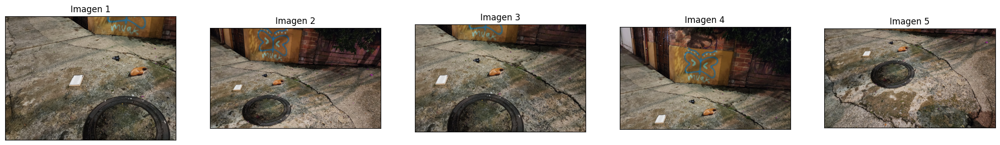

In [ ]:
# Importar imagenes
img1 = cv2.imread('img1.jpg')
img2 = cv2.imread('img2.jpg')
img3 = cv2.imread('img3.jpg')
img4 = cv2.imread('img4.jpg')
img5 = cv2.imread('img5.jpg')

# Convertirlas a RGB
img_rgb1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img_rgb2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img_rgb3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
img_rgb4 = cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)
img_rgb5 = cv2.cvtColor(img5, cv2.COLOR_BGR2RGB)

# Visualizar imagenes
plt.figure(figsize=(25,5))

plt.subplot(151)
plt.title('Imagen 1')
plt.imshow(img_rgb1)
plt.xticks([]), plt.yticks([])

plt.subplot(152)
plt.title('Imagen 2')
plt.imshow(img_rgb2)
plt.xticks([]), plt.yticks([])

plt.subplot(153)
plt.title('Imagen 3')
plt.imshow(img_rgb3)
plt.xticks([]), plt.yticks([])

plt.subplot(154)
plt.title('Imagen 4')
plt.imshow(img_rgb4)
plt.xticks([]), plt.yticks([])

plt.subplot(155)
plt.title('Imagen 5')
plt.imshow(img_rgb5)
plt.xticks([]), plt.yticks([])

plt.show()

**Encontrar órden óptimo de emparejamiento**

Para encontrar el órden óptimo de emparejamiento creamos una función encontrar_orden, que recibe como parámetros las 5 imagenes. Crea un objeto SIFT y un objeto FLANN y empieza a evaluar todas las posibles permutaciones de las imagenes, haciendo emparejamientos consecutivos 2 a 2 y obteniendo la sumatoria de todos los emparejamientos por cada iteración.

La función es básicamente un algoritmo de búsqueda de máximos que retorna el orden con el cual se obtiene la suma de mayor valor

Si bien en el proyecto se requiere utilizar Brute-Force, Brute-Force es una técnica de búsqueda bastante exhaustiva que compara cada descriptor del primer par de la imagen con todos los descriptores de entrenamiento uno por uno. Esto genera un gran costo computacional pero también proporciona una mayor precisión y más información. El algoritmo FLANN hace una búsqueda únicamente de los vecinos más cercanos, lo que la hace mucho más rápida y es por eso que es el método que se implementa en esta función porque esta ya genera un alto costo computacional.

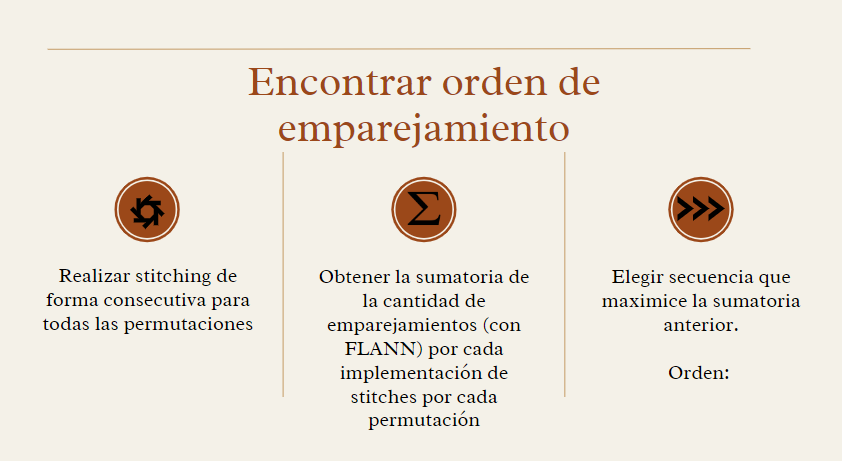

Teóricamente esta función debería sacar el mejor emparejamiento pero su alto costo computacional nos hizo inclinarnos por elegir el orden de las imagenes basandonos en las dimensiones de estas, ya que se ralizan transformaciones geométricas y para comenzar deben buscarse los pares que pueden recuperar la mayor parte de la información.

In [ ]:
# Importar imagenes de nuevo según el orden obtenido
img1 = cv2.imread('img1.jpg')
img2 = cv2.imread('img3.jpg')
img3 = cv2.imread('img2.jpg')
img4 = cv2.imread('img4.jpg')
img5 = cv2.imread('img5.jpg')


# Convertirlas a RGB
img_rgb1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img_rgb2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img_rgb3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
img_rgb4 = cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)
img_rgb5 = cv2.cvtColor(img5, cv2.COLOR_BGR2RGB)

**Unión de las fotografías 1 y 2**



In [ ]:
# Crear objeto SIFT
sift = cv2.SIFT_create()

# Obtención de puntos de interés y descriptores
[keypoints1, descriptors1] = sift.detectAndCompute(img_rgb1, None) # Puntos de interés imagen 1
[keypoints2, descriptors2] = sift.detectAndCompute(img_rgb2, None) # Puntos de interés imagen 2


print('Puntos de interés imagen 1: ', format(len(keypoints1)))
print('Puntos de interés imagen 2: ', format(len(keypoints2)))

Puntos de interés imagen 1:  21319
Puntos de interés imagen 2:  23941


Ahora visualizaremos la magnitud y dirección de cada gradiente de los puntos de interés:

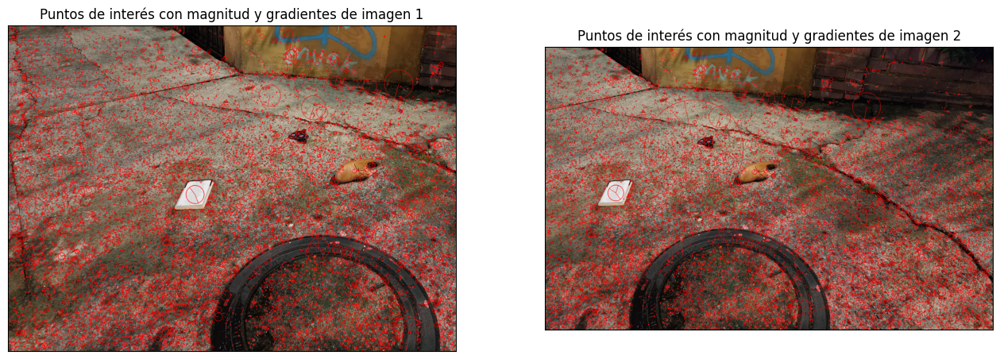

In [ ]:
# Para la imagen 1
img1_SIFT = cv2.drawKeypoints(img_rgb1, keypoints1, None, color=(255,0,0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_SIFT = cv2.drawKeypoints(img_rgb2, keypoints2, None, color=(255,0,0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(16,8))

plt.subplot(121)
plt.title('Puntos de interés con magnitud y gradientes de imagen 1')
plt.imshow(img1_SIFT)
plt.xticks([]), plt.yticks([])

plt.subplot(122)
plt.title('Puntos de interés con magnitud y gradientes de imagen 2')
plt.imshow(img2_SIFT)
plt.xticks([]), plt.yticks([])

plt.show()

Podemos ver que sin ningún umbral, SIFT reconoce 21319 puntos de interés en la imagen 1 y 21821 puntos de interés en la imagen 2.

A continuación haremos el emparejamiento con Brute-Force, una técnica de búsqueda bastante exhaustiva que compara cada descriptor del primer par de la imagen con todos los descriptores de entrenamiento uno por uno. Esto genera un gran costo computacional pero también proporciona una mayor precisión y más información.



In [ ]:
# Crear el Brute-Force Matcher
bf_SIFT = cv2.BFMatcher(cv2.NORM_L2)
matches1_2 = bf_SIFT.knnMatch(descriptors1,descriptors2,k=2)

good = []
good_homography = []
for m,n in matches1_2:
  if m.distance < 0.65*n.distance:
    good.append([m])
    good_homography.append(m)

print("puntos de interés emparejados 1:", format(len(good)))

puntos de interés emparejados 1: 12515


El algoritmo Brute-Force hace un emparejamiento de 1461 puntos de interés.

A continuación visualizaremos los puntos emparejados con este método

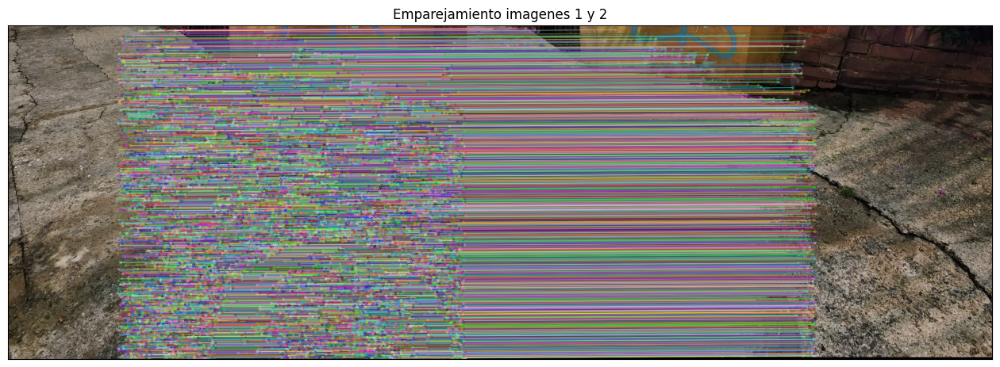

In [ ]:
# Dibujar los puntos de interés correspondientes
img1_2 = cv2.drawMatchesKnn(img_rgb1,keypoints1,img_rgb2,keypoints2,good,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Emparejamiento imagenes 1 y 2
plt.figure(figsize=(16, 16))
plt.imshow(img1_2)
plt.title('Emparejamiento imagenes 1 y 2')
plt.xticks([]), plt.yticks([])
plt.show()

Ahora haremos la obtención de los parámetros de movimiento entre planos ( matriz de transformación de perspectiva) utilizando RANSAC,  que indica la transformación geométrica que hacen los puntos emparejados.

In [ ]:
orig_pts1_SIFT = np.float32([keypoints1[m.queryIdx].pt for m in good_homography]).reshape(-1,1,2)
dest_pts1_SIFT = np.float32([keypoints2[m.trainIdx].pt for m in good_homography]).reshape(-1,1,2)

method = cv2.RANSAC
[MT1_RANSAC,_] = cv2.findHomography(orig_pts1_SIFT, dest_pts1_SIFT, method, 5.0)

print("Matriz de transformación de perspectiva imagen 1 Y 2:")
print(MT1_RANSAC)

Matriz de transformación de perspectiva imagen 1 Y 2:
[[ 9.99985596e-01 -4.04702766e-06 -3.41989911e+02]
 [-1.44276471e-06  9.99994392e-01 -5.99953994e+00]
 [-4.09710107e-09 -6.87478651e-09  1.00000000e+00]]


Para terminar este proceso, unimos las imagenes con la función de stitching de opencv, que usa un conjunto de métodos optimizados para tiempo y precisión y sobrepone las imagenes según la homografía obtenida.

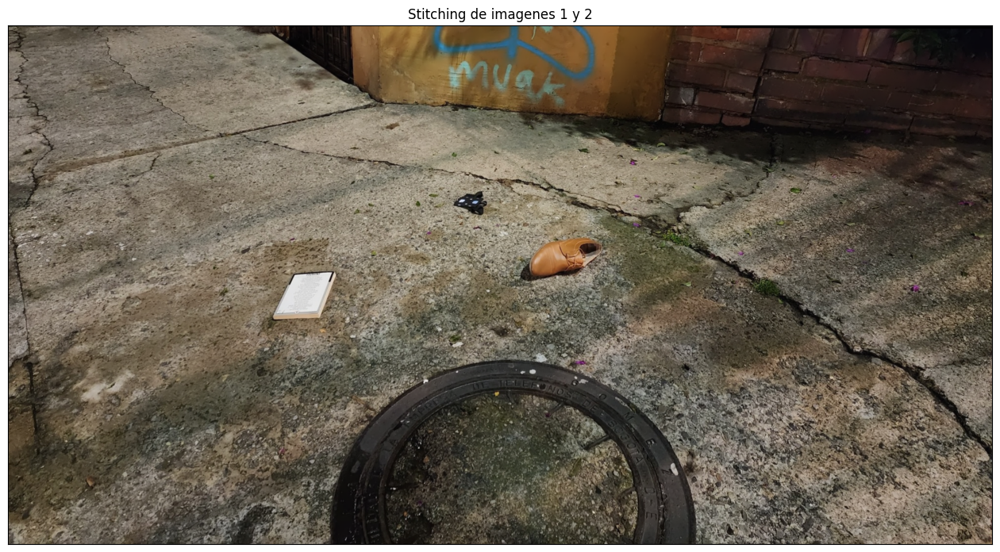

In [ ]:
images = []
images.append(img_rgb1)
images.append(img_rgb2)

# Crear objeto para hacer stitching
stitchy = cv2.Stitcher_create()

(_,img_rgb12) = stitchy.stitch(images)

plt.figure(figsize=(16, 16))
plt.imshow(img_rgb12)
plt.title('Stitching de imagenes 1 y 2')
plt.xticks([]), plt.yticks([])
plt.show()

Ahora realizaremos este proceso iterativamente para el resto de las imagenes.

**Unión imagen 1,2 y 3**

In [ ]:
# Crear objeto SIFT
sift = cv2.SIFT_create()

# Obtención de puntos de interés y descriptores
[keypoints12, descriptors12] = sift.detectAndCompute(img_rgb12, None) # Puntos de interés imagen 1_2
[keypoints3, descriptors3] = sift.detectAndCompute(img_rgb3, None) # Puntos de interés imagen 3


print('Puntos de interés imagen 1_2: ', format(len(keypoints12)))
print('Puntos de interés imagen 3: ', format(len(keypoints3)))

Puntos de interés imagen 1_2:  32579
Puntos de interés imagen 3:  21821


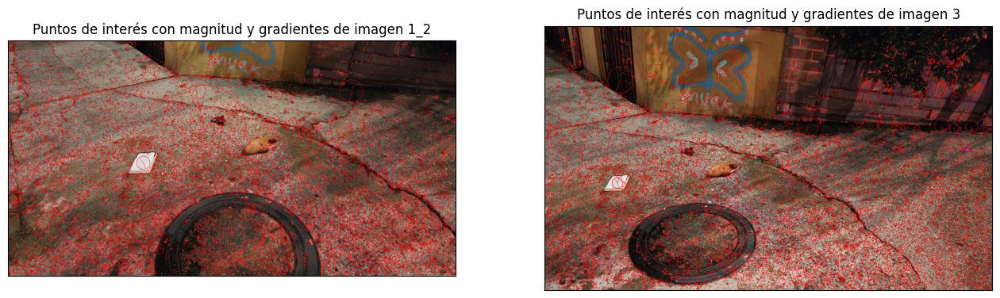

In [ ]:
# Para la imagen 1
img12_SIFT = cv2.drawKeypoints(img_rgb12, keypoints12, None, color=(255,0,0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img3_SIFT = cv2.drawKeypoints(img_rgb3, keypoints3, None, color=(255,0,0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(16,8))

plt.subplot(121)
plt.title('Puntos de interés con magnitud y gradientes de imagen 1_2')
plt.imshow(img12_SIFT)
plt.xticks([]), plt.yticks([])

plt.subplot(122)
plt.title('Puntos de interés con magnitud y gradientes de imagen 3')
plt.imshow(img3_SIFT)
plt.xticks([]), plt.yticks([])

plt.show()

In [ ]:
# Crear el Brute-Force Matcher
bf_SIFT = cv2.BFMatcher(cv2.NORM_L2)
matches12_3 = bf_SIFT.knnMatch(descriptors12,descriptors3,k=2)

good = []
good_homography = []
for m,n in matches12_3:
  if m.distance < 0.65*n.distance:
    good.append([m])
    good_homography.append(m)

print("puntos de interés emparejados 1_2 con la 3:", format(len(good)))

puntos de interés emparejados 1_2 con la 3: 1641


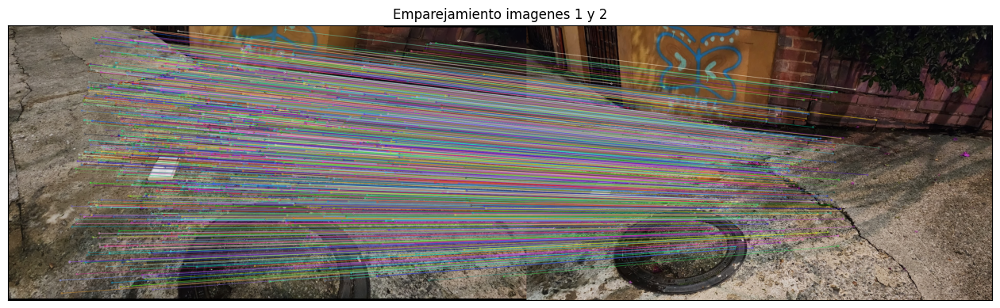

In [ ]:
# Dibujar los puntos de interés correspondientes
img12_3 = cv2.drawMatchesKnn(img_rgb12,keypoints12,img_rgb3,keypoints3,good,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Emparejamiento imagenes 1 y 2
plt.figure(figsize=(16, 16))
plt.imshow(img12_3)
plt.title('Emparejamiento imagenes 1 y 2')
plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
orig_pts1_SIFT = np.float32([keypoints12[m.queryIdx].pt for m in good_homography]).reshape(-1,1,2)
dest_pts1_SIFT = np.float32([keypoints3[m.trainIdx].pt for m in good_homography]).reshape(-1,1,2)

method = cv2.RANSAC
[MT1_RANSAC,_] = cv2.findHomography(orig_pts1_SIFT, dest_pts1_SIFT, method, 5.0)

print("Matriz de transformación de perspectiva imagen 1_2 Y 3:")
print(MT1_RANSAC)

Matriz de transformación de perspectiva imagen 1_2 Y 3:
[[ 1.00534766e+00  1.40991600e-01 -3.24389834e+02]
 [ 1.63126800e-02  1.03597822e+00  2.00969250e+02]
 [ 3.01743276e-05  3.92059426e-04  1.00000000e+00]]


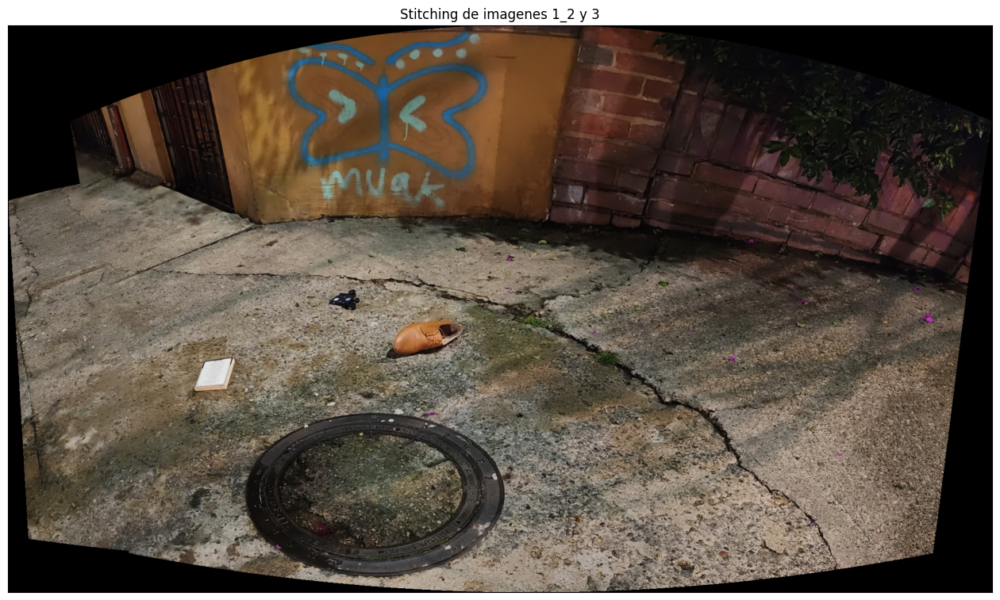

In [ ]:
images = []
images.append(img_rgb12)
images.append(img_rgb3)

stitchy = cv2.Stitcher.create()
(_,img_rgb123) = stitchy.stitch(images)

plt.figure(figsize=(16, 16))
plt.imshow(img_rgb123)
plt.title('Stitching de imagenes 1_2 y 3')
plt.xticks([]), plt.yticks([])
plt.show()

**Unión imagenes 1,2,3 y 4**

A continuación uniremos la imágen 4 con el proceso de Stitching.

In [ ]:
# Crear objeto SIFT
sift = cv2.SIFT_create()

# Obtención de puntos de interés y descriptores
[keypoints123, descriptors123] = sift.detectAndCompute(img_rgb123, None) # Puntos de interés imagen 1_2
[keypoints4, descriptors4] = sift.detectAndCompute(img_rgb4, None) # Puntos de interés imagen 3


print('Puntos de interés imagen 1_2_3: ', format(len(keypoints123)))
print('Puntos de interés imagen 4: ', format(len(keypoints4)))

Puntos de interés imagen 1_2_3:  25816
Puntos de interés imagen 4:  15289


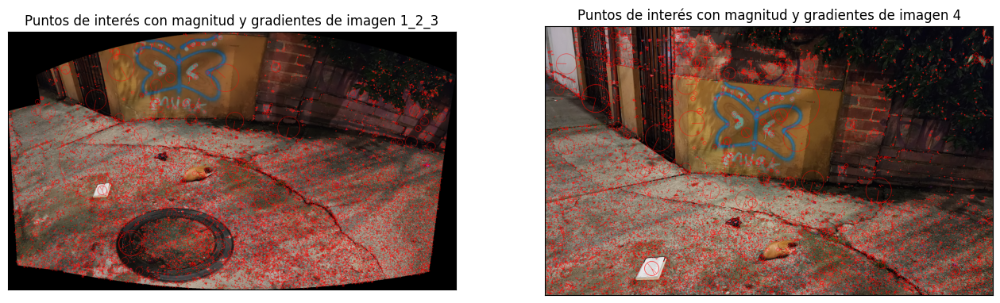

In [ ]:
# Para la imagen 1_2_3 y 4
img123_SIFT = cv2.drawKeypoints(img_rgb123, keypoints123, None, color=(255,0,0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img4_SIFT = cv2.drawKeypoints(img_rgb4, keypoints4, None, color=(255,0,0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(16,8))

plt.subplot(121)
plt.title('Puntos de interés con magnitud y gradientes de imagen 1_2_3')
plt.imshow(img123_SIFT)
plt.xticks([]), plt.yticks([])

plt.subplot(122)
plt.title('Puntos de interés con magnitud y gradientes de imagen 4')
plt.imshow(img4_SIFT)
plt.xticks([]), plt.yticks([])

plt.show()

In [ ]:
# Crear el Brute-Force Matcher
bf_SIFT = cv2.BFMatcher(cv2.NORM_L2)
matches123_4 = bf_SIFT.knnMatch(descriptors123,descriptors4,k=2)

good = []
good_homography = []
for m,n in matches123_4:
  if m.distance < 0.65*n.distance:
    good.append([m])
    good_homography.append(m)

print("puntos de interés emparejados 1_2_3 con la 4:", format(len(good)))

puntos de interés emparejados 1_2_3 con la 4: 1552


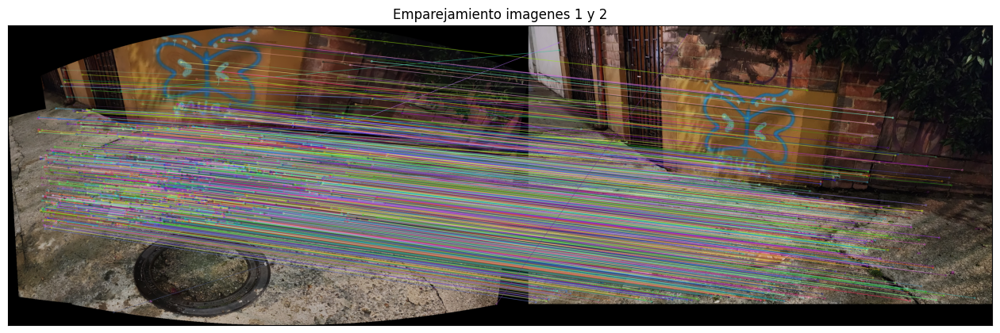

In [ ]:
# Dibujar los puntos de interés correspondientes
img123_4 = cv2.drawMatchesKnn(img_rgb123,keypoints123,img_rgb4,keypoints4,good,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Emparejamiento imagenes 1 y 2
plt.figure(figsize=(16, 16))
plt.imshow(img123_4)
plt.title('Emparejamiento imagenes 1 y 2')
plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
orig_pts1_SIFT = np.float32([keypoints123[m.queryIdx].pt for m in good_homography]).reshape(-1,1,2)
dest_pts1_SIFT = np.float32([keypoints4[m.trainIdx].pt for m in good_homography]).reshape(-1,1,2)

method = cv2.RANSAC
[MT1_RANSAC,_] = cv2.findHomography(orig_pts1_SIFT, dest_pts1_SIFT, method, 5.0)

print("Matriz de transformación de perspectiva imagen 1_2_3 Y 4:")
print(MT1_RANSAC)

Matriz de transformación de perspectiva imagen 1_2_3 Y 4:
[[ 1.25555603e+00 -3.50894111e-01  6.25904120e+01]
 [ 3.86219182e-01  7.51748272e-01  7.29720852e+01]
 [ 3.39257630e-04 -4.77894119e-04  1.00000000e+00]]


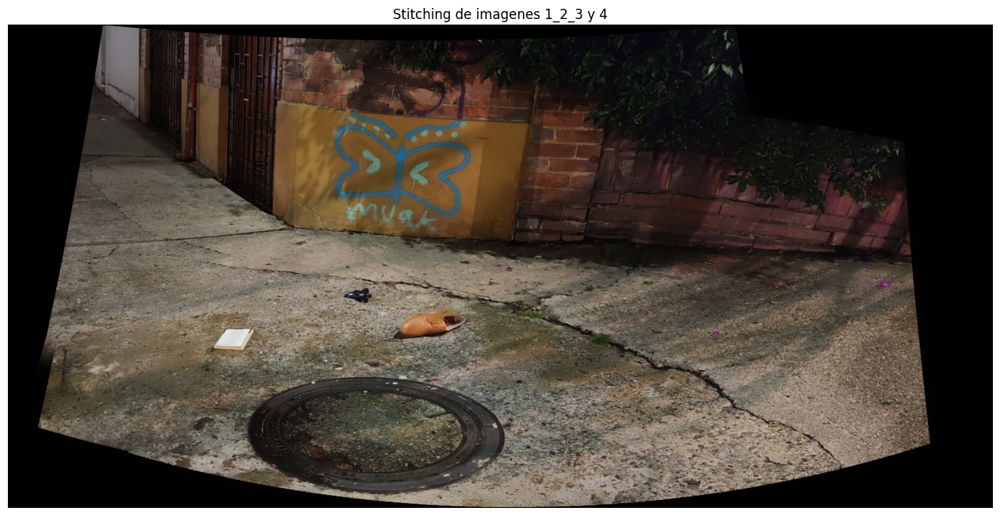

In [ ]:
images = []
images.append(img_rgb123)
images.append(img_rgb4)

stitchy = cv2.Stitcher.create()
(_,img_rgb1234) = stitchy.stitch(images)

plt.figure(figsize=(16, 16))
plt.imshow(img_rgb1234)
plt.title('Stitching de imagenes 1_2_3 y 4')
plt.xticks([]), plt.yticks([])
plt.show()

**Unión final**

Por ultimo pegaremos la última imágen 5 con el stitching generado anteriormente.

In [ ]:
# Crear objeto SIFT
sift = cv2.SIFT_create()

# Obtención de puntos de interés y descriptores
[keypoints1234, descriptors1234] = sift.detectAndCompute(img_rgb1234, None) # Puntos de interés imagen 1_2_3_4
[keypoints5, descriptors5] = sift.detectAndCompute(img_rgb5, None) # Puntos de interés imagen 5


print('Puntos de interés imagen 1_2_3_4: ', format(len(keypoints1234)))
print('Puntos de interés imagen 5: ', format(len(keypoints5)))

Puntos de interés imagen 1_2_3_4:  36427
Puntos de interés imagen 5:  44464


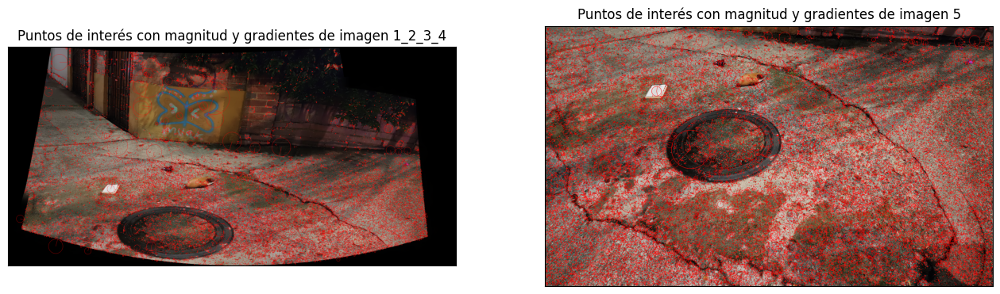

In [ ]:
# Para la imagen 1_2_3 y 4
img1234_SIFT = cv2.drawKeypoints(img_rgb1234, keypoints1234, None, color=(255,0,0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img5_SIFT = cv2.drawKeypoints(img_rgb5, keypoints5, None, color=(255,0,0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(16,8))

plt.subplot(121)
plt.title('Puntos de interés con magnitud y gradientes de imagen 1_2_3_4')
plt.imshow(img1234_SIFT)
plt.xticks([]), plt.yticks([])

plt.subplot(122)
plt.title('Puntos de interés con magnitud y gradientes de imagen 5')
plt.imshow(img5_SIFT)
plt.xticks([]), plt.yticks([])

plt.show()

In [ ]:
# Crear el Brute-Force Matcher
bf_SIFT = cv2.BFMatcher(cv2.NORM_L2)
matches1234_5 = bf_SIFT.knnMatch(descriptors1234,descriptors5,k=2)

good = []
good_homography = []
for m,n in matches1234_5:
  if m.distance < 0.65*n.distance:
    good.append([m])
    good_homography.append(m)

print("puntos de interés emparejados 1_2_3_4 con la 5:", format(len(good)))

puntos de interés emparejados 1_2_3_4 con la 5: 5878


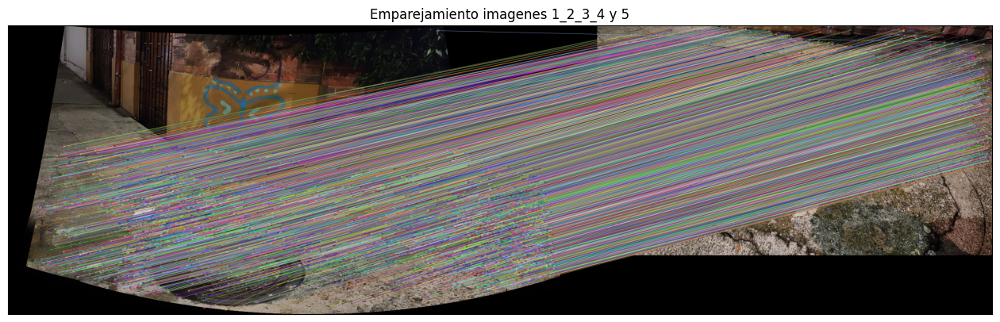

In [ ]:
# Dibujar los puntos de interés correspondientes
img1234_5 = cv2.drawMatchesKnn(img_rgb1234,keypoints1234,img_rgb5,keypoints5,good,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Emparejamiento imagenes 1 y 2
plt.figure(figsize=(16, 16))
plt.imshow(img1234_5)
plt.title('Emparejamiento imagenes 1_2_3_4 y 5')
plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
orig_pts1_SIFT = np.float32([keypoints1234[m.queryIdx].pt for m in good_homography]).reshape(-1,1,2)
dest_pts1_SIFT = np.float32([keypoints5[m.trainIdx].pt for m in good_homography]).reshape(-1,1,2)

method = cv2.RANSAC
[MT1_RANSAC,_] = cv2.findHomography(orig_pts1_SIFT, dest_pts1_SIFT, method, 5.0)

print("Matriz de transformación de perspectiva imagen 1_2_3_4 Y 5:")
print(MT1_RANSAC)

Matriz de transformación de perspectiva imagen 1_2_3_4 Y 5:
[[ 7.00036402e-02 -7.89103694e-03  6.79267331e+02]
 [-2.07496194e-02  4.80613630e-01 -2.49828890e+02]
 [-2.10326493e-04  1.49261490e-05  1.00000000e+00]]


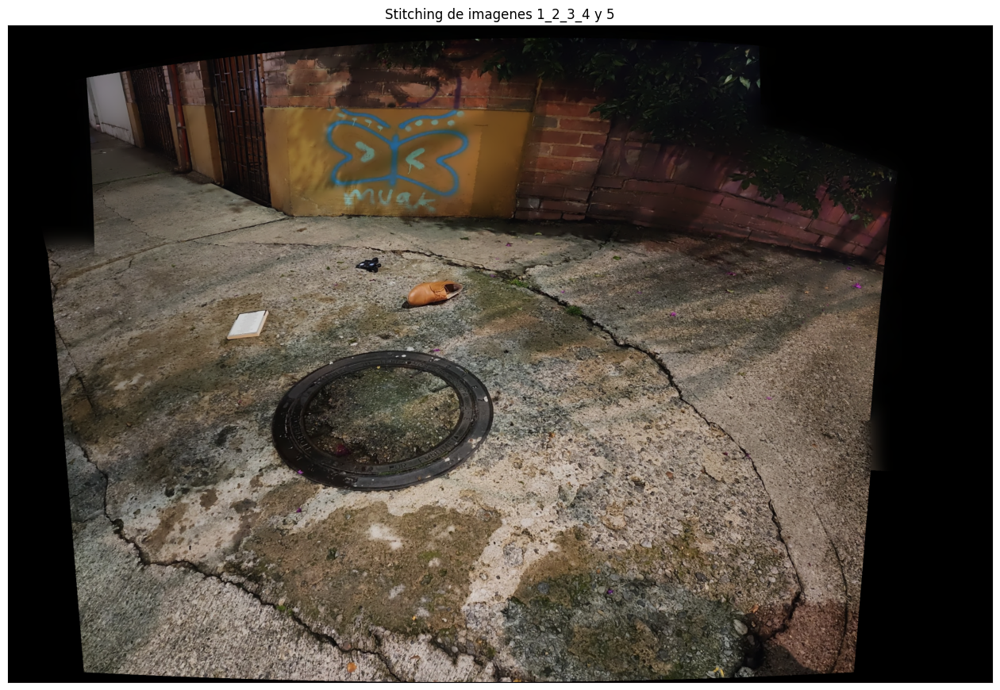

In [ ]:
images = []
images.append(img_rgb1234)
images.append(img_rgb5)

stitchy = cv2.Stitcher.create()
(_,img_rgb12345) = stitchy.stitch(images)

plt.figure(figsize=(16, 16))
plt.imshow(img_rgb12345)
plt.title('Stitching de imagenes 1_2_3_4 y 5')
plt.xticks([]), plt.yticks([])
plt.show()

**Conclusiones**

El orden es muy relevante en este algoritmo. El encontrar el orden adecuado para llevar a cabo el proceso puede ser muy costoso computacionalmente, y este costo aumenta factorialmente según el número de imagenes a unir. Es por eso que teniendo en cuenta que el algoritmo de stitching usa transformaciones geométricas, es útil hallar la secuencia de emparejamiento teniendo en cuenta las dimensiones de las imagenes.

Brute-Force es un algoritmo exhaustivo que resulta en una mayor precisión que FLANN, pero que demora mucho tiempo más en ejecutar. Su uso debe evaluarse según el objetivo del emparejamiento y detección de características.